In [40]:
import pandas as pd
import numpy as np

#### Read the 'avocado.csv' with pandas. Make sure a new unnecessary column is not generated.

In [2]:
avocado = pd.read_csv("avocado.csv")
avocado.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [3]:
avocado.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   Date          18249 non-null  object 
 2   AveragePrice  18249 non-null  float64
 3   Total Volume  18249 non-null  float64
 4   4046          18249 non-null  float64
 5   4225          18249 non-null  float64
 6   4770          18249 non-null  float64
 7   Total Bags    18249 non-null  float64
 8   Small Bags    18249 non-null  float64
 9   Large Bags    18249 non-null  float64
 10  XLarge Bags   18249 non-null  float64
 11  type          18249 non-null  object 
 12  year          18249 non-null  int64  
 13  region        18249 non-null  object 
dtypes: float64(9), int64(2), object(3)
memory usage: 1.9+ MB


#### Explore the dataset, pay attention to redundancies, note the categorical (non-numeric) variables.

In [4]:
#label encode region
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
avocado['region'] = le.fit_transform(avocado['region'])

#renaming columns for better understanding
avocado.rename(columns={'4046':'Small_sold',
                          '4225':'Large_sold',
                          '4770':'XLarge_sold'}, 
                 inplace=True)

In [5]:
avocado['Date']=pd.to_datetime(avocado['Date'])
avocado['Month']=avocado['Date'].apply(lambda x:x.month)
avocado['Day']=avocado['Date'].apply(lambda x:x.day)
avocado.head(3)

,Unnamed: 0,Date,AveragePrice,Total Volume,Small_sold,Large_sold,XLarge_sold,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,Month,Day
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,0,12,27
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,0,12,20
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,0,12,13


In [27]:
import plotly.offline as py
import plotly.graph_objs as go

Type=avocado.groupby('type')['Total Volume'].agg('sum')

values=[Type['conventional'],Type['organic']]
labels=['conventional','organic']

trace=go.Pie(labels=labels,values=values)
py.iplot([trace])

C:\Users\dell\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='AveragePrice'>

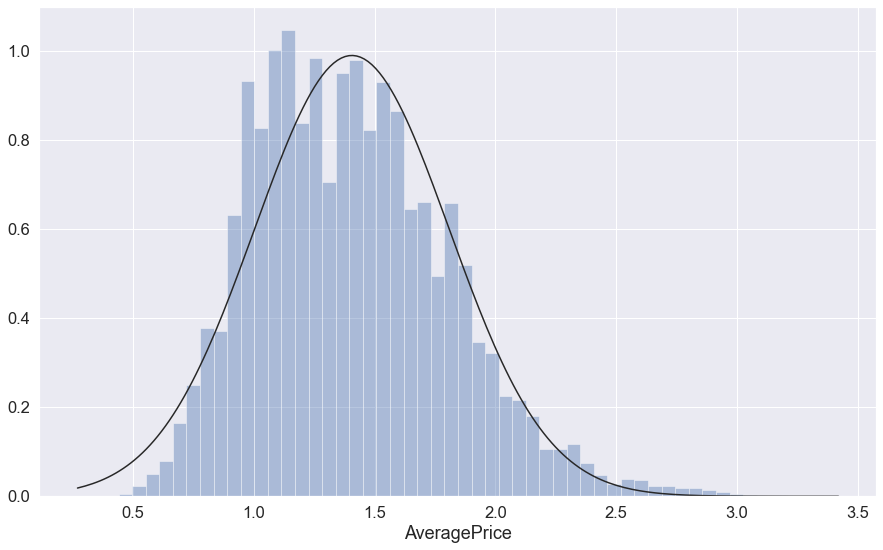

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt



sns.set(font_scale=1.5) 
from scipy.stats import norm
fig, ax = plt.subplots(figsize=(15, 9))
sns.distplot(a=avocado.AveragePrice, kde=False, fit=norm)



<AxesSubplot:xlabel='Month', ylabel='AveragePrice'>

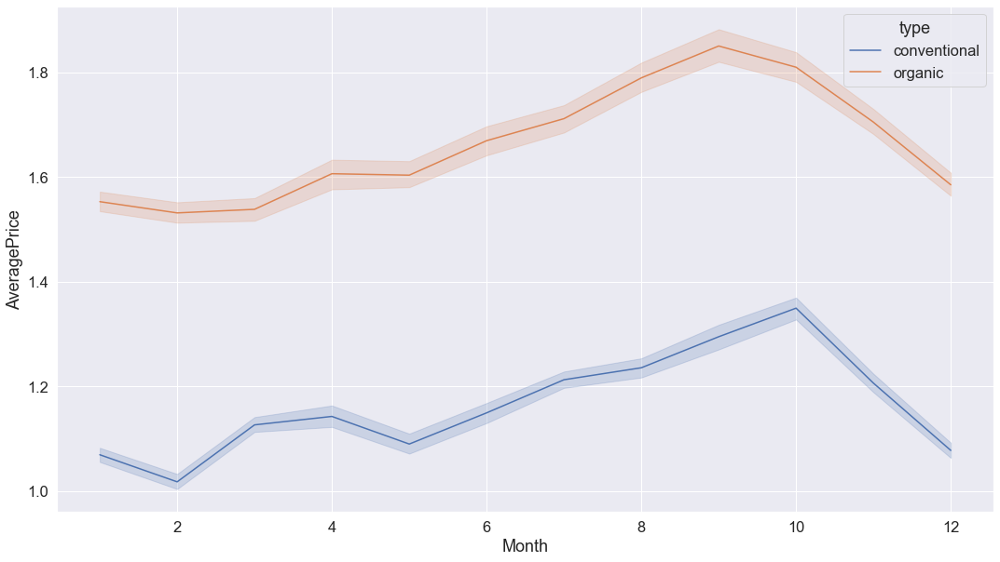

In [8]:


plt.figure(figsize=(18,10))
sns.lineplot(x="Month", y="AveragePrice", hue='type', data=avocado)



Text(0.5, 1.0, 'Average Price of Avocado According to Region')

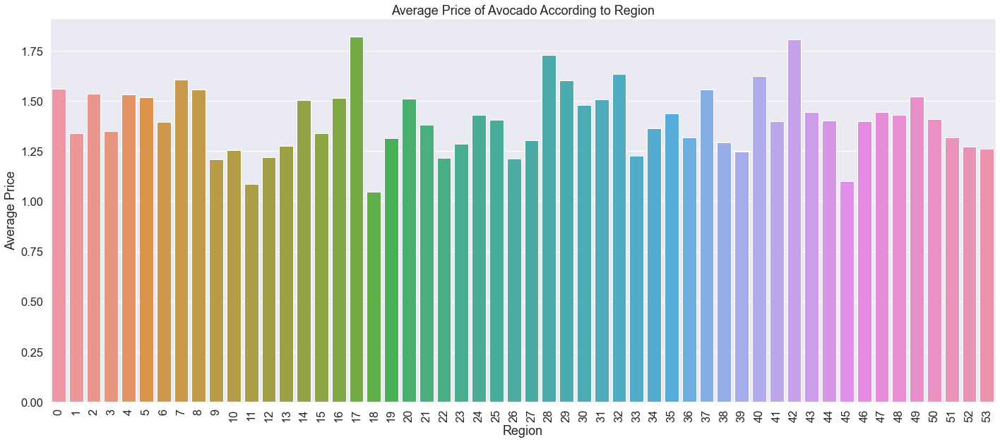

In [9]:
region_list=list(avocado.region.unique())
average_price=[]

for i in region_list:
    x=avocado[avocado.region==i]
    region_average=sum(x.AveragePrice)/len(x)
    average_price.append(region_average)

df1=pd.DataFrame({'region_list':region_list,'average_price':average_price})
new_index=df1.average_price.sort_values(ascending=False).index.values
sorted_data=df1.reindex(new_index)

plt.figure(figsize=(24,10))
ax=sns.barplot(x=sorted_data.region_list,y=sorted_data.average_price)

plt.xticks(rotation=90)
plt.xlabel('Region')
plt.ylabel('Average Price')
plt.title('Average Price of Avocado According to Region')

In [13]:
# import sys
# !{sys.executable} -m pip install pandas-profiling

import pandas_profiling
profile = pandas_profiling.ProfileReport(avocado)

In [15]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Drop the unnecessary columns, if any. 

In [16]:
avocado.drop("Unnamed: 0", axis=1,inplace=True)

In [35]:
avocado.type.unique()

avocado = pd.get_dummies(avocado, columns=['type'],drop_first=True)
avocado.head()

,Date,AveragePrice,Total Volume,Small_sold,Large_sold,XLarge_sold,Total Bags,Small Bags,Large Bags,XLarge Bags,year,region,Month,Day,type_organic
0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,2015,0,12,27,0
1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,2015,0,12,20,0
2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,2015,0,12,13,0
3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,2015,0,12,6,0
4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,2015,0,11,29,0


#### Choose the 'AveragePrice' column as your target (y) variable.

In [36]:
y = avocado.AveragePrice

#### Devide data into Train and Test sets with the ratio 80:20.

In [45]:
from sklearn.model_selection import train_test_split



X=avocado.iloc[:,2:13]
y=avocado['AveragePrice']
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)



def split(X,y):
    return train_test_split(X, y, test_size=0.20, random_state=1)


X_train, X_test, y_train, y_test=split(X,y)

print('X_train shape: ',X_train.shape)
print('y_train shape: ',y_train.shape)

print('X_test shape: ',X_test.shape)
print('y_test shape: ',y_test.shape)


X_train shape:  (14599, 11)
y_train shape:  (14599,)
X_test shape:  (3650, 11)
y_test shape:  (3650,)


In [46]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
lr.fit(X_train,y_train)
pred=lr.predict(X_test)

In [47]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, pred))
print('MSE:', metrics.mean_squared_error(y_test, pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, pred)))

MAE: 0.30859701318744465
MSE: 0.14755587096345638
RMSE: 0.3841300183055945


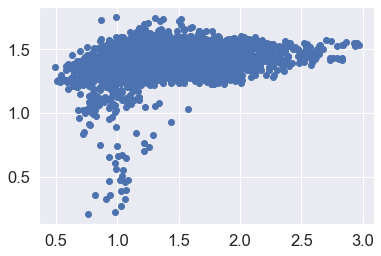

In [48]:
plt.scatter(x=y_test,y=pred)

,Y Test,Pred
14192,2.11,1.448968
1873,0.98,1.487355
7293,1.17,1.411732
15087,1.78,1.448307
9888,1.61,1.324720


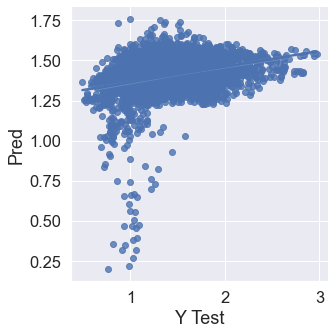

In [49]:
data = pd.DataFrame({'Y Test':y_test , 'Pred':pred},columns=['Y Test','Pred'])
sns.lmplot(x='Y Test',y='Pred',data=data,palette='rainbow')
data.head()
